## This notebook will go through setting up linear models with BrainStat using data from hippunfold outputs.

This tutorial requires `wb_command` to be in your bash path.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
import os
import sys
from brainspace.mesh.mesh_io import read_surface
sys.path.insert(1, '/home/ROBARTS/myousif/hippunfold_toolbox')
from hippunfold_toolbox import plotting
import importlib
importlib.reload(plotting)

<module 'hippunfold_toolbox.plotting' from '/home/ROBARTS/myousif/hippunfold_toolbox/hippunfold_toolbox/plotting.py'>

In [2]:
hippunfold_dir = '/home/ROBARTS/myousif/graham/projects/ctb-akhanf/ext-bids/maastricht_dm2/DM2_output/DM2_hippunfold_v1.0.0_run1/hippunfold/'

surface_path = '/home/ROBARTS/myousif/hippunfold_toolbox/resources/canonical_surfs/tpl-avg_space-canonical_den-0p5mm_label-hipp_midthickness.surf.gii'
flatmap_path = '/home/ROBARTS/myousif/hippunfold_toolbox/resources/unfold_template_hipp/tpl-avg_space-unfold_den-0p5mm_midthickness.surf.gii'

subjects = [ sub.replace('sub-','') for sub in os.listdir(hippunfold_dir) if 'sub-' in sub ]
hemi = ['L','R']
label = ['hipp']
density = '0p5mm'

output_dir = 'brainstat_tutorial_output'
smooth_dir = os.path.join(output_dir,'smoothed')

os.makedirs(smooth_dir,exist_ok=True)

### 0) Smoothing

Smoothing is often required for random field theory in neuroimaging because brain imaging data are typically noisy and spatially correlated. Smoothing helps to increase the statistical power of random field theory analyses by reducing the number of independent measurements and increasing the signal-to-noise ratio. This is important because random field theory is based on the assumption that the data are smooth and continuous, and that there is spatial autocorrelation between neighboring data points.

In [ ]:
# remove after tutorial
subjects = [path.split('_')[0].replace('sub-','') for path in os.listdir(smooth_dir) if 'hemi-L' in path]

In [ ]:
sigma = 2 #Gaussian smoothing kernal sigma (mm)

for subject in subjects:
    for h in range(len(hemi)):
        for l in range(len(label)):
            cmd = f'wb_command -metric-smoothing '\
                f'{hippunfold_dir}/sub-{subject}/surf/sub-{subject}_hemi-{hemi[h]}_space-T1w_den-{density}_label-{label[l]}_midthickness.surf.gii '\
                f'{hippunfold_dir}/sub-{subject}/surf/sub-{subject}_hemi-{hemi[h]}_space-T1w_den-{density}_label-{label[l]}_thickness.shape.gii '\
                f'{sigma} '\
                f'{smooth_dir}/sub-{subject}_hemi-{hemi[h]}_space-T1w_den-{density}_label-{label[l]}_desc-smoothed_thickness.shape.gii'
            !{cmd}

### 1) Loading smoothed surface data

We load the smoothed thickness data into numpy arrays with nibabel.

In [4]:
thick_dict = {'L':[], 'R': []}

for subject in subjects:
    for h in hemi:
        thick_dict[h].append(nib.load(
            f'{smooth_dir}/sub-{subject}_hemi-{h}_space-T1w_den-{density}_label-{label[0]}_desc-smoothed_thickness.shape.gii'
        ).darrays[0].data)

In [5]:
thickL = np.vstack(thick_dict['L'])
thickR = np.vstack(thick_dict['R'])
thickLR = np.hstack([thickL,thickR])

We are going to need to plot our data at different points in our analysis and to make it a bit easier we will wrap the code required to plot it in a function.

In [6]:
def plot_surf(data, window=None, excludeDG=True, density='0p5mm'):
    if window == None:
        im = plt.imshow(data.reshape(-1,1).T);

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8), subplot_kw={'projection': "3d"})
        fig.set_dpi(300)

        plotting.surfplot_canonical_foldunfold(ax,cdata=data,excludeDG=excludeDG,den=density)

        cbar_ax = fig.add_axes([0.85, 0.35, 0.05, 0.3])
        fig.colorbar(im, cax=cbar_ax);
        
    else:
        im = plt.imshow(data.reshape(-1,1).T,vmin=window[0],vmax=window[1]);

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8), subplot_kw={'projection': "3d"})
        fig.set_dpi(300)

        plotting.surfplot_canonical_foldunfold(ax,cdata=data,excludeDG=excludeDG,den=density, cwindow=window)

        cbar_ax = fig.add_axes([0.85, 0.35, 0.05, 0.3])
        fig.colorbar(im, cax=cbar_ax);

Just to showcase the plotting function here is the mean smoothed thickness across all subjects.

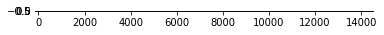

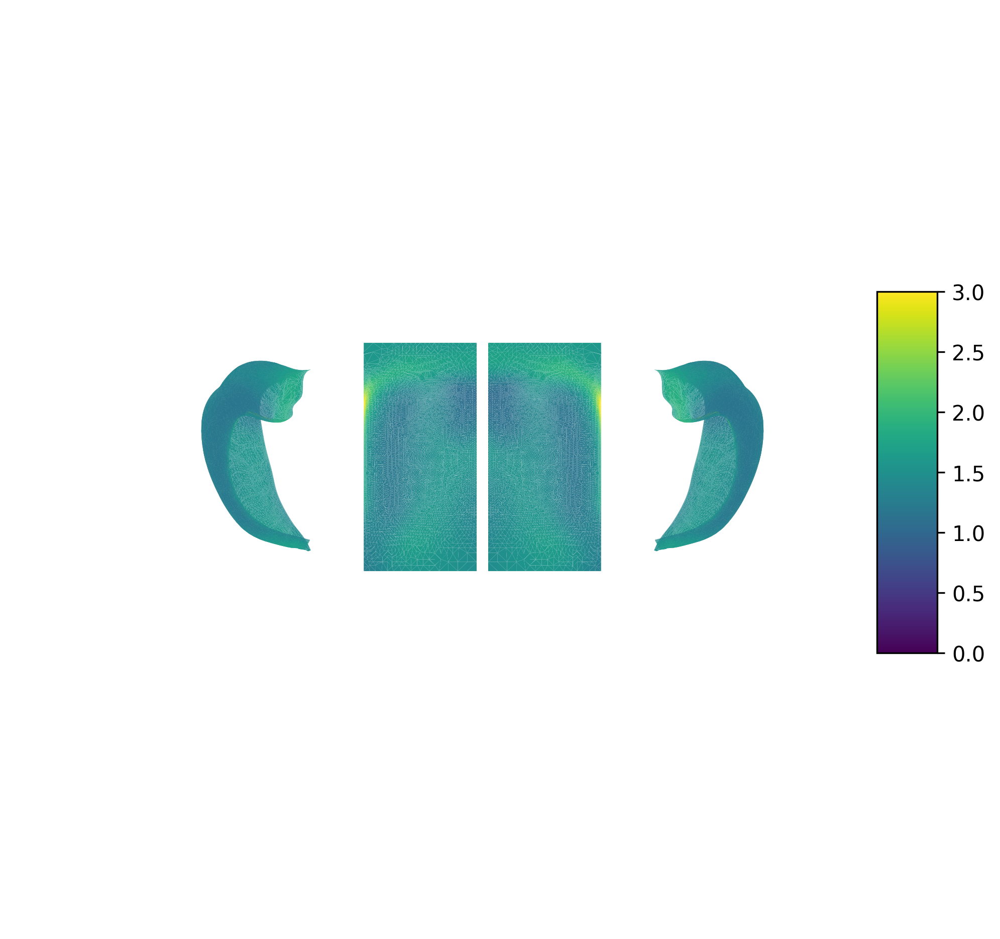

In [7]:
plot_surf(thickLR.mean(axis=0),window=[0,3])

### 2) Load your non-imaging data

Brainstat works well with pandas dataframes and so loading your data with pandas is fairly standard. The main consideration that must be made is reordering the rows of your pandas dataframe to match the order of the thickness data we loaded earlier.

In [8]:
df = pd.read_csv('sourcedata/participant_data.csv')
df = df.set_index('participant_id').loc[subjects].reset_index()

In [51]:
df.head().iloc[:,1:]

,participant_age,participant_sex,participant_size,participant_weight,group
0,57.0,M,162.0,72.0,controls
1,72.0,M,180.0,84.0,dm
2,71.0,F,171.0,70.0,controls
3,61.0,F,171.0,77.0,dm
4,60.0,F,179.0,80.0,dm


 ### 3) Defining and running your linear models
 
#### Model 1:
To start off we are going to assess if subject age affects hippocampal thickness. We begin by declaring age as a `FixedEffect`. This fixed effects generate the design matrix representing our model and can be added together or multiplied to represent variable interation. For our first model we define it `Y = intercept + B1*age`. Brainstat includes an intercept by default.

In [10]:
from brainstat.stats.terms import FixedEffect

term_age = FixedEffect(df.participant_age)
term_sex = FixedEffect(df.participant_sex)
term_weight = FixedEffect(df.participant_weight)
term_group = FixedEffect(df.group)

model_age = term_age


In [11]:
model_age

,intercept,participant_age
0,1,57.0
1,1,72.0
2,1,71.0
3,1,61.0
4,1,60.0
...,...,...
126,1,62.0
127,1,67.0
128,1,70.0
129,1,53.0


A surface is required for random field theory correction and so we load in a surface to provide to the `SLM` function that  we use to initialize and fit the model to the hippocampal thickness data. To evaluate whether thickness is different over the span of ages we define a contrast variable.

You can run these models either with the hippocampal data concatenated or with them seperately. In this case we will be running each hemisphere seperately.

In the `SLM` function we specify different types of correction:
1. False discovery rate (fdr): used to control the proportion of false postive finding when conducting multiple hypothesis test on a dataset. It adjusts p-values of individal tests based on the number of tests being conducted and proportion of false positives that are considered acceptable.
2. Random field theory (rft): used to analyze spatial data that are correlated. It takes into account these spatial correlations to calculate probability of observing those values by chance and identifys regions that are significantly different than what would be attributed to chance. RFT is also the reason we smoothed our data earlier.

In [12]:
from brainstat.stats.SLM import SLM

surf = read_surface(surface_path)

contrast_age = df.participant_age

slm_ageL =  SLM(
    model_age,
    contrast_age,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_ageL.fit(thickL)

slm_ageR =  SLM(
    model_age,
    contrast_age,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_ageR.fit(thickR)

The resulting models, slm_ageL and slm_ageR will contain t statitic maps and p-values derived with requested corrections, along with other properties (see brainstat API).

By default brainstat runs a two tailed test and provides p-values at vertex wise (peaks) and at the level of clusters. Peaks and clusters can tell us if a tested effect is at the level of local foci or at at larger scale regions. Data on peaks is stored in `BrainStatModel.P.peak` or  for clusters in `BrainStatModel.P.clus`. Brainstat runs a two-tailed test by default and so it returns a two tables for the contrast provided (table 1) and for the inverse contrast (table 2).

In [13]:
slm_ageL.P['peak'][0].head()

,t,vertid,clusid,P
0,2.5170057407245845,2772,1,0.6193698792874297


In [14]:
slm_ageL.P['peak'][1].head()

,t,vertid,clusid,P
0,4.522956,6225,1,0.001785
1,4.499260,6264,1,0.001944
2,4.465133,2225,1,0.002204
3,3.939013,337,1,0.013575
4,3.628821,108,1,0.036038


In [15]:
slm_ageR.P['peak'][0].head()

,t,vertid,clusid,P
0,2.405436,65,2,0.788163
1,2.387737,453,1,0.815885


In [16]:
slm_ageR.P['peak'][1].head()

,t,vertid,clusid,P
0,4.111751,6076,1,0.007771
1,4.092631,6036,1,0.008293
2,3.853302,5171,4,0.018226
3,3.561648,4891,3,0.044867
4,3.531428,4881,3,0.049034


In [17]:
slm_ageL.P['clus'][0].head()

,clusid,nverts,resels,P
0,1,10.0,0.04216422316091876,0.45729991617858196


In [18]:
slm_ageL.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,370.0,2.048007,0.003019
1,2,250.0,0.702622,0.092249
2,3,125.0,0.547640,0.137370
3,4,77.0,0.392634,0.202984


In [19]:
slm_ageR.P['clus'][0].head()

,clusid,nverts,resels,P
0,1,2.0,0.006250,0.498469
1,2,2.0,0.003129,0.501586


In [20]:
slm_ageR.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,650.0,2.016009,0.003324
1,2,125.0,0.688848,0.097246
2,3,258.0,0.666611,0.102984
3,4,76.0,0.232843,0.303440
4,5,22.0,0.223540,0.310114


Here we are aggregating p-values using 5% as our threshold for significance:

In [21]:
peak_sigL = slm_ageL.P['pval']['P']<0.05
peak_sigR = slm_ageR.P['pval']['P']<0.05
clus_sigL = slm_ageL.P['pval']['C']<0.05
clus_sigR = slm_ageR.P['pval']['C']<0.05

Here we are visualizing t-statistics which is used to measure how far a sample mean is from a hypothesized population mean normalized by the estimated standard deviation of the mean.

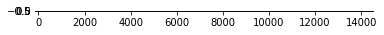

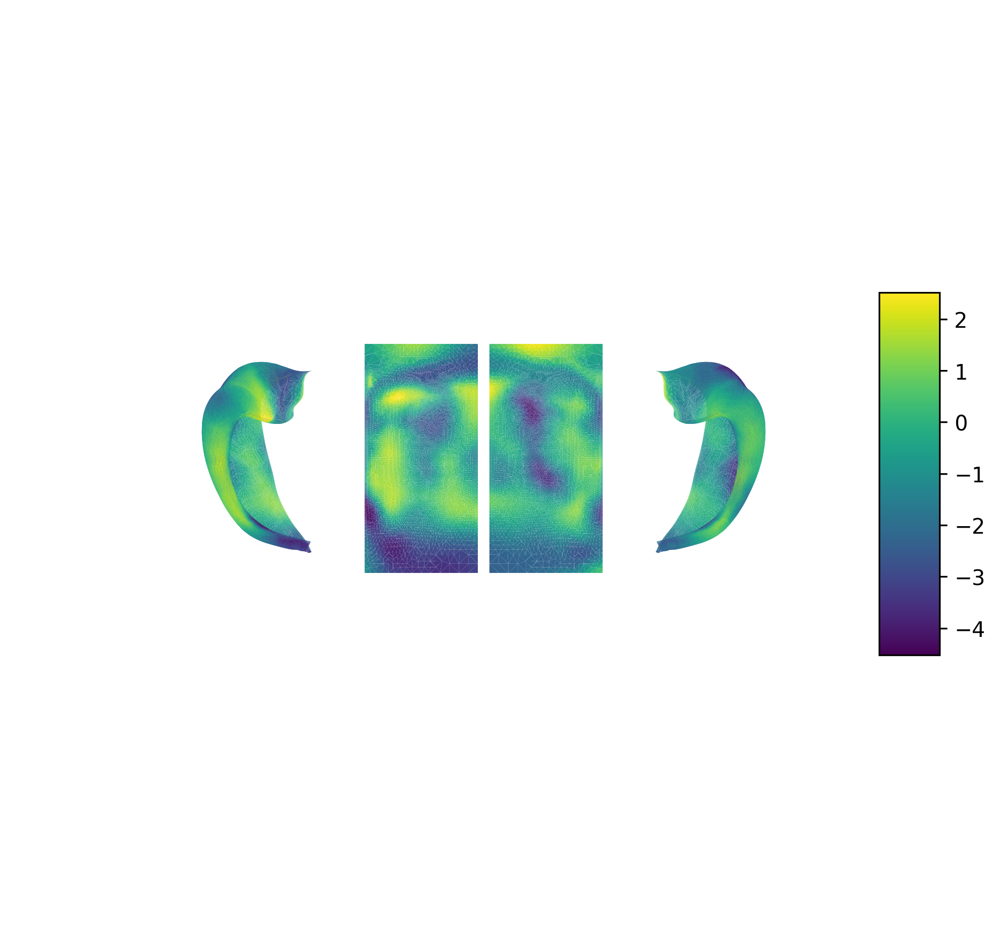

In [22]:
plot_surf(np.hstack([slm_ageL.t,slm_ageR.t]).T)

Significant peak verticies:

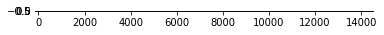

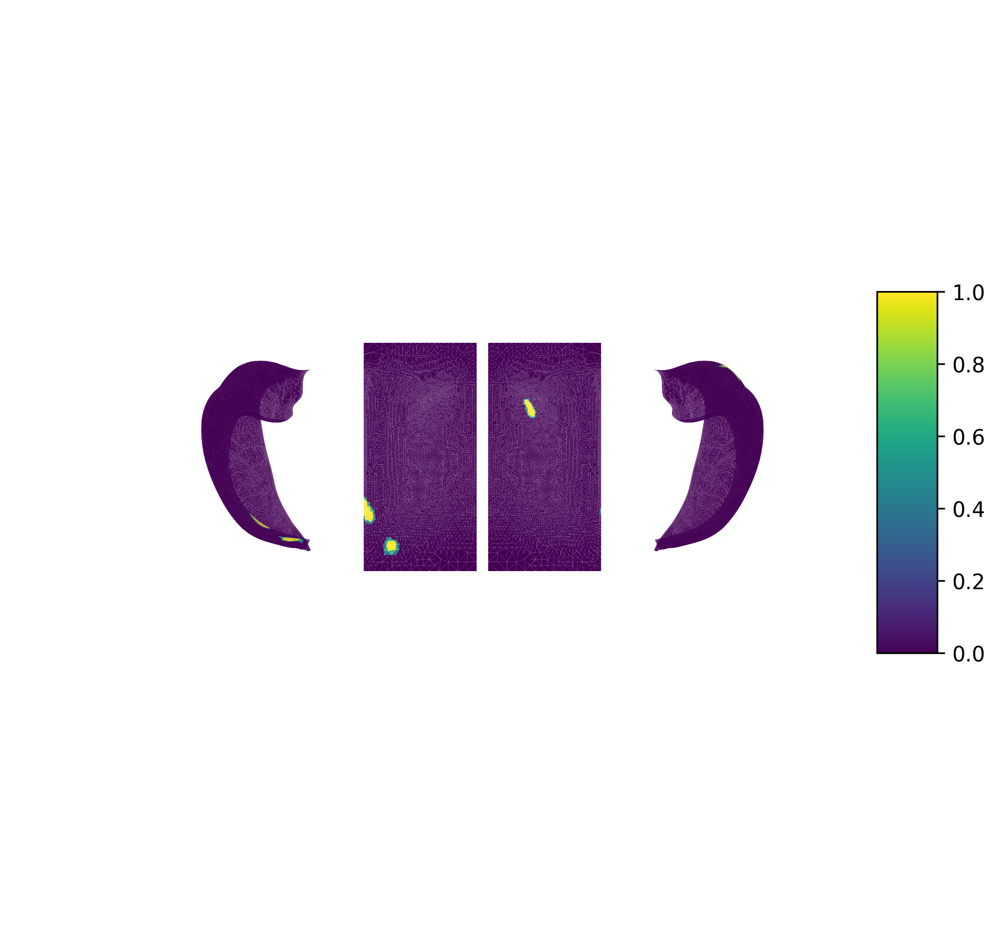

In [23]:
plot_surf(np.hstack([peak_sigL,peak_sigR]).T)

Significant clusters:

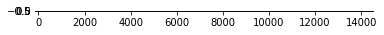

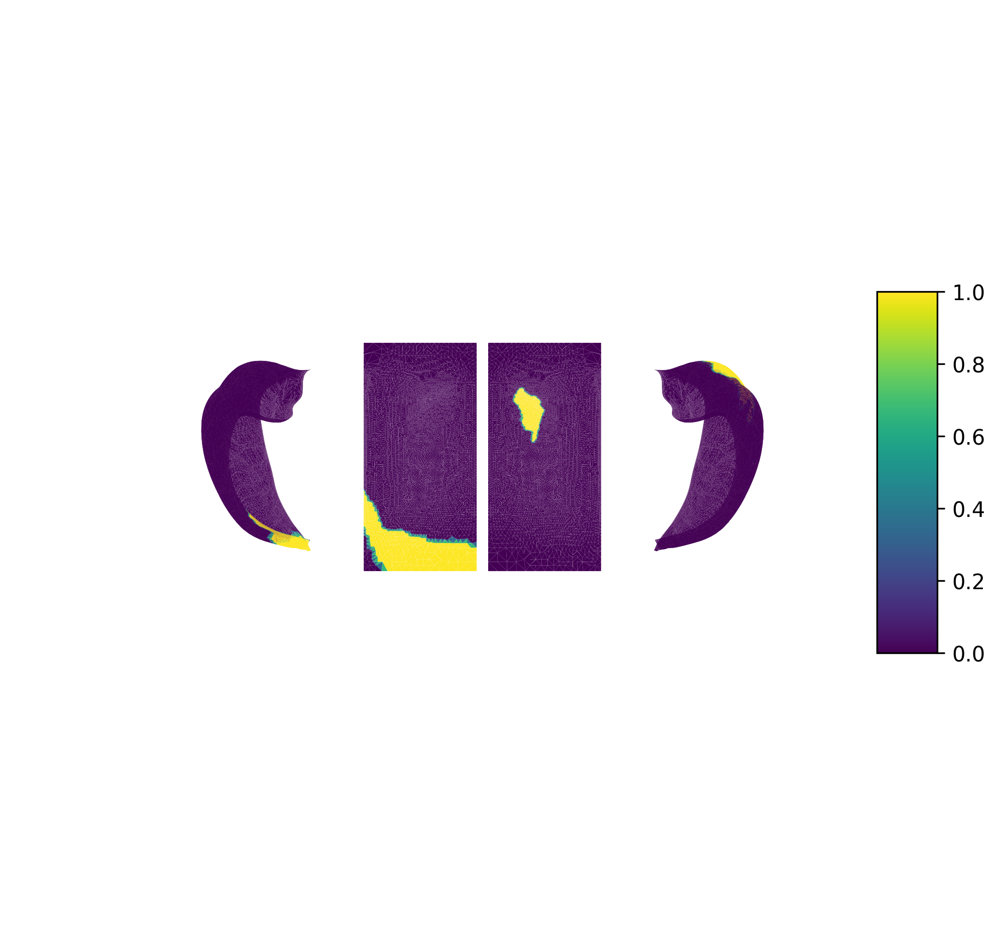

In [24]:
plot_surf(np.hstack([clus_sigL,clus_sigR]).T)

#### Model 2:

For this model we are looking at the relationship between sex and hippocampal thickness. So we outline our model with terms for age and sex. We also define our contrast by encoding males to 1 and females to -1. The subsequent visualizations are similar to the previous model.

In [25]:
model_sexage = term_age + term_sex

contrast_sex = (df.participant_sex == 'M').astype(int) - (df.participant_sex == 'W').astype(int)

slm_sexageL =  SLM(
    model_sexage,
    contrast_sex,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_sexageL.fit(thickL)

slm_sexageR =  SLM(
    model_sexage,
    contrast_sex,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_sexageR.fit(thickR)

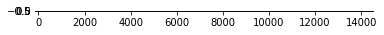

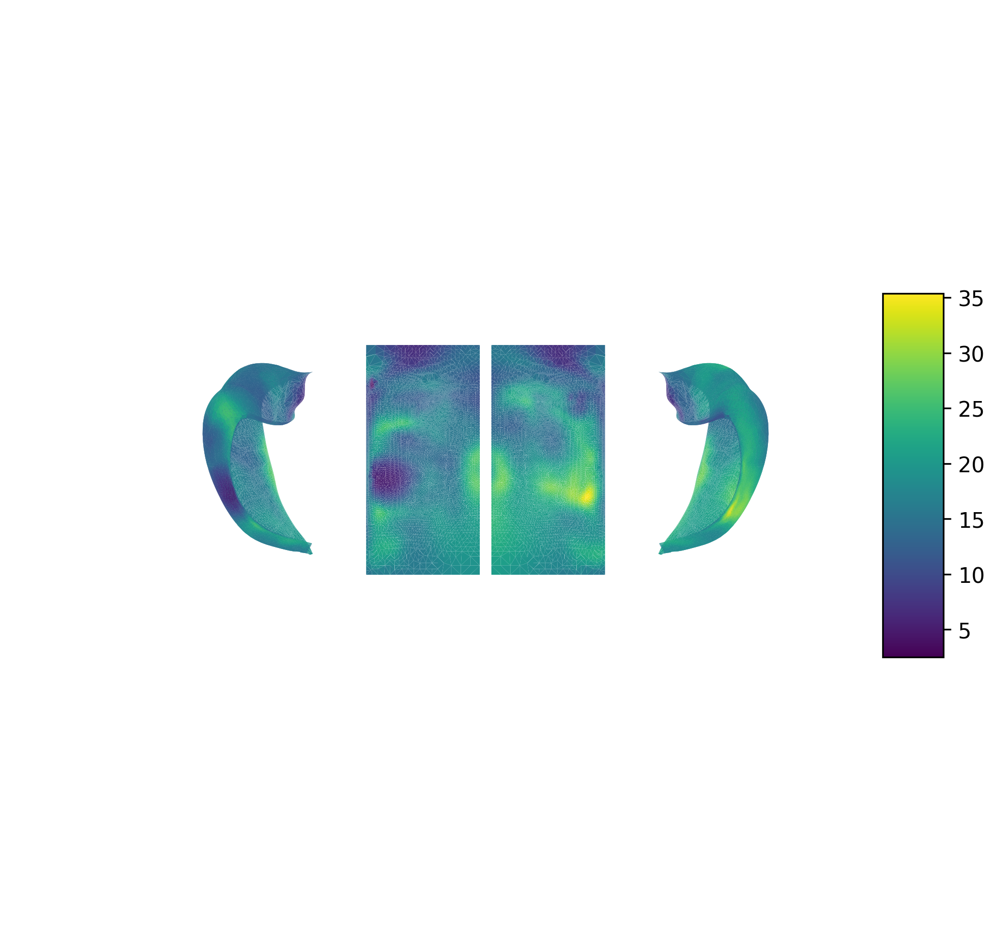

In [26]:
plot_surf(np.hstack([slm_sexageL.t,slm_sexageR.t]).T)

In [27]:
peak1_sigL = slm_sexageL.P['pval']['P']<0.05
peak1_sigR = slm_sexageR.P['pval']['P']<0.05
clus1_sigL = slm_sexageL.P['pval']['C']<0.05
clus1_sigR = slm_sexageR.P['pval']['C']<0.05

In [28]:
slm_sexageL.P['peak'][0].head()

,t,vertid,clusid,P
0,26.987985,2416,1,4.201666e-51
1,26.599110,2837,1,2.029615e-50
2,25.816534,1515,1,5.057052e-49
3,25.768909,1376,1,6.257026e-49
4,25.554183,3003,1,1.537364e-48


Wow our hippocampi are on fire! I guess we can take this as a sign that sex does affect hippocampal thickness in our dataset.

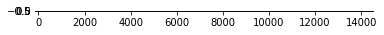

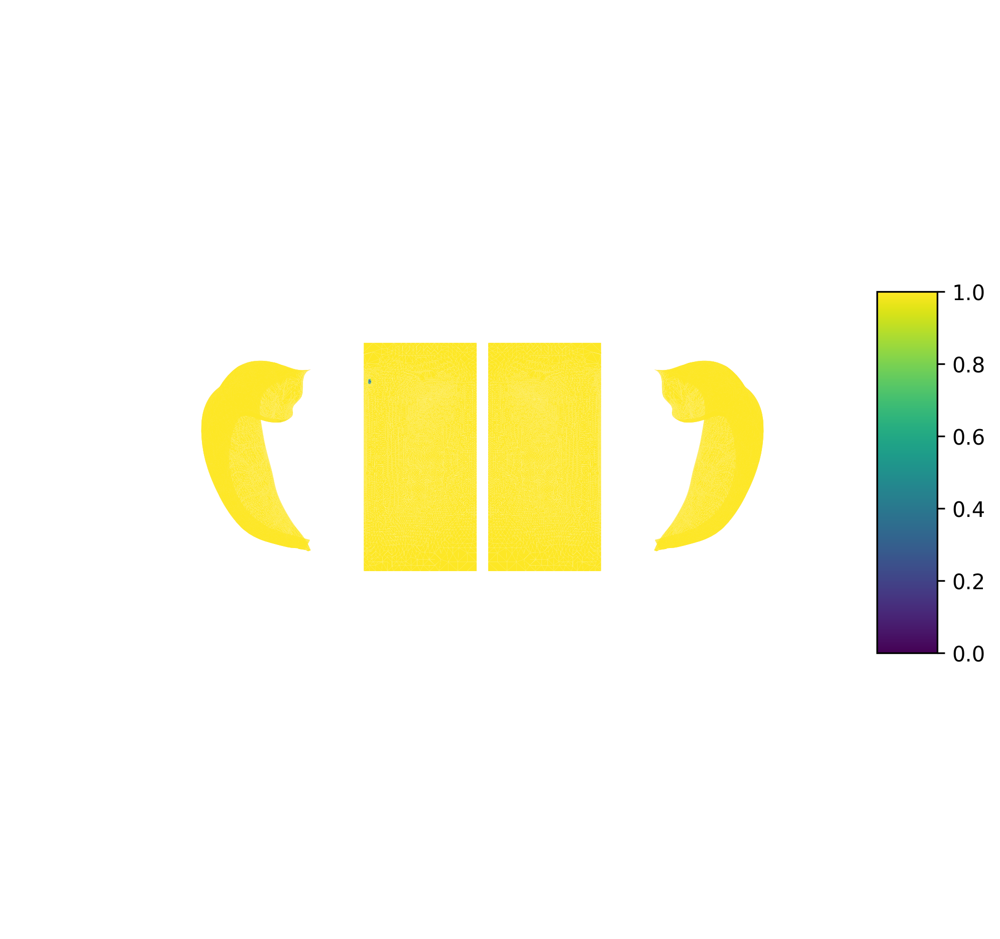

In [29]:
plot_surf(np.hstack([peak1_sigL,peak1_sigR]).T)

### Model 3: 
Age may affect men and women differently and so we could try to account for this in our model. Why don't we look at the effect of sex on hippocampal thickness again but this time we can add a term taking the interaction of age and sex represented by `term_age*term_sex`.

In [30]:
model_sexage = term_age + term_sex + term_age*term_sex

contrast_sex = (df.participant_sex == 'M').astype(int) - (df.participant_sex == 'W').astype(int)

slm_sexage2L =  SLM(
    model_sexage,
    contrast_sex,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_sexage2L.fit(thickL)

slm_sexage2R =  SLM(
    model_sexage,
    contrast_sex,
    surf=surf,
    correction = ['fdr','rft'],
    cluster_threshold=0.01
)
slm_sexage2R.fit(thickR)

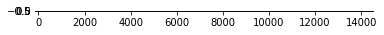

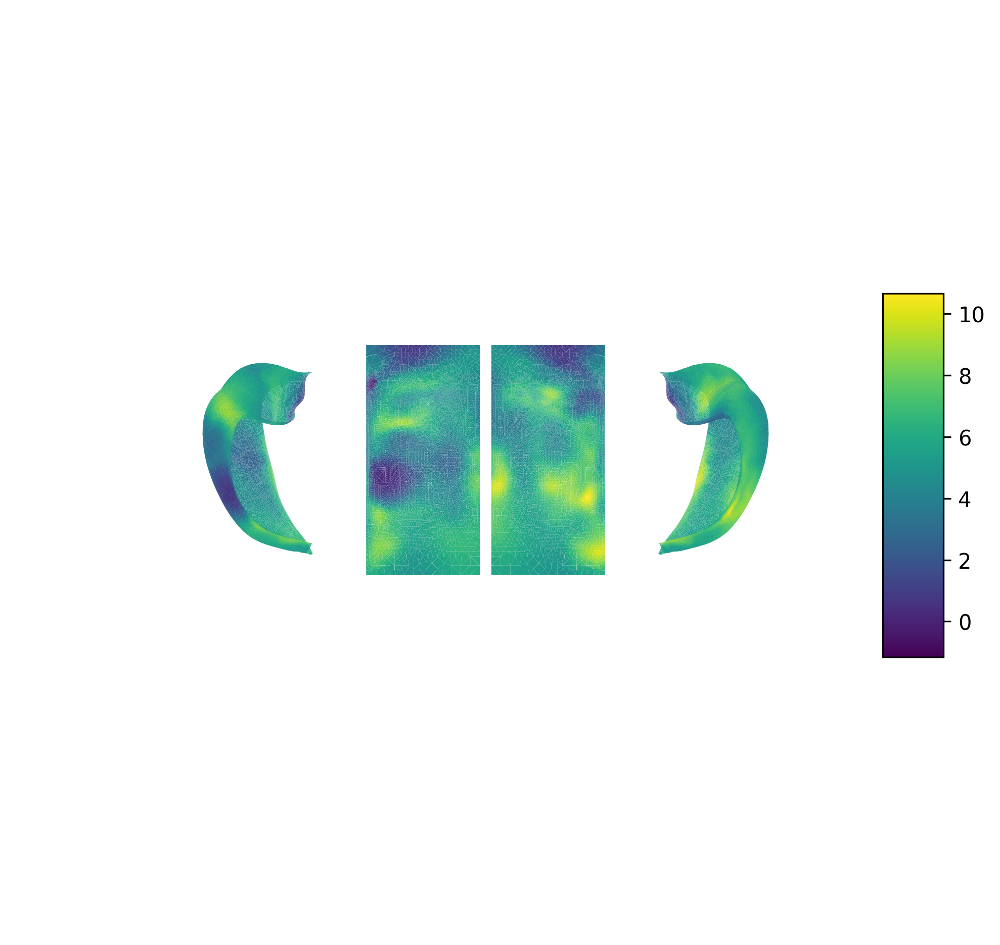

In [31]:
plot_surf(np.hstack([slm_sexage2L.t,slm_sexage2R.t]).T)

In [32]:
peak2_sigL = slm_sexage2L.P['pval']['P']<0.05
peak2_sigR = slm_sexage2R.P['pval']['P']<0.05
clus2_sigL = slm_sexage2L.P['pval']['C']<0.05
clus2_sigR = slm_sexage2R.P['pval']['C']<0.05

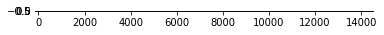

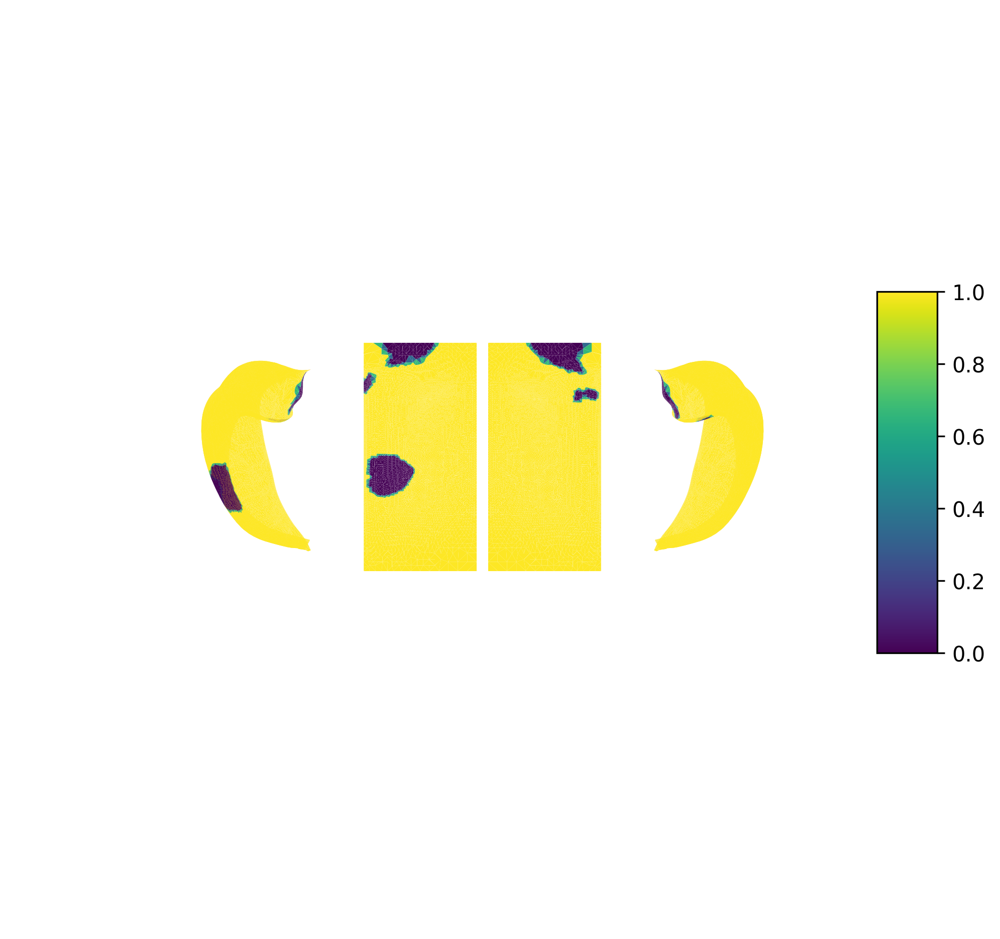

In [33]:
plot_surf(np.hstack([clus2_sigL,clus2_sigR]).T)

#### Model 4:
Now we would like to compare different groups in our data. So for the dataset we are working with here contains two groups, healthy controls and subjects with type II diabetes. We encode our contrast similarly to how we encode sex and feed that to the `SLM` function.


In [34]:
model_group = term_age + term_sex + term_age*term_sex + term_group

contrast_group = (df.group == 'dm').astype(int) - (df.group == 'controls').astype(int)

slm_groupL = SLM(
    model_group,
    contrast_group,
    surf=surf,
    correction=["fdr", "rft"],
    cluster_threshold=0.01,
)

slm_groupL.fit(thickL)

slm_groupR = SLM(
    model_group,
    contrast_group,
    surf=surf,
    correction=["fdr", "rft"],
    cluster_threshold=0.01,
)

slm_groupR.fit(thickR)

So we can see that the contrast encodes diabetes as 1 and controls as -1. In the t-statistics we can then associated negative t-values as hippocampal thining when associated with diabetes (not saying that it is necessarily significant at the moment though).

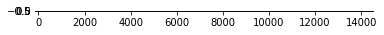

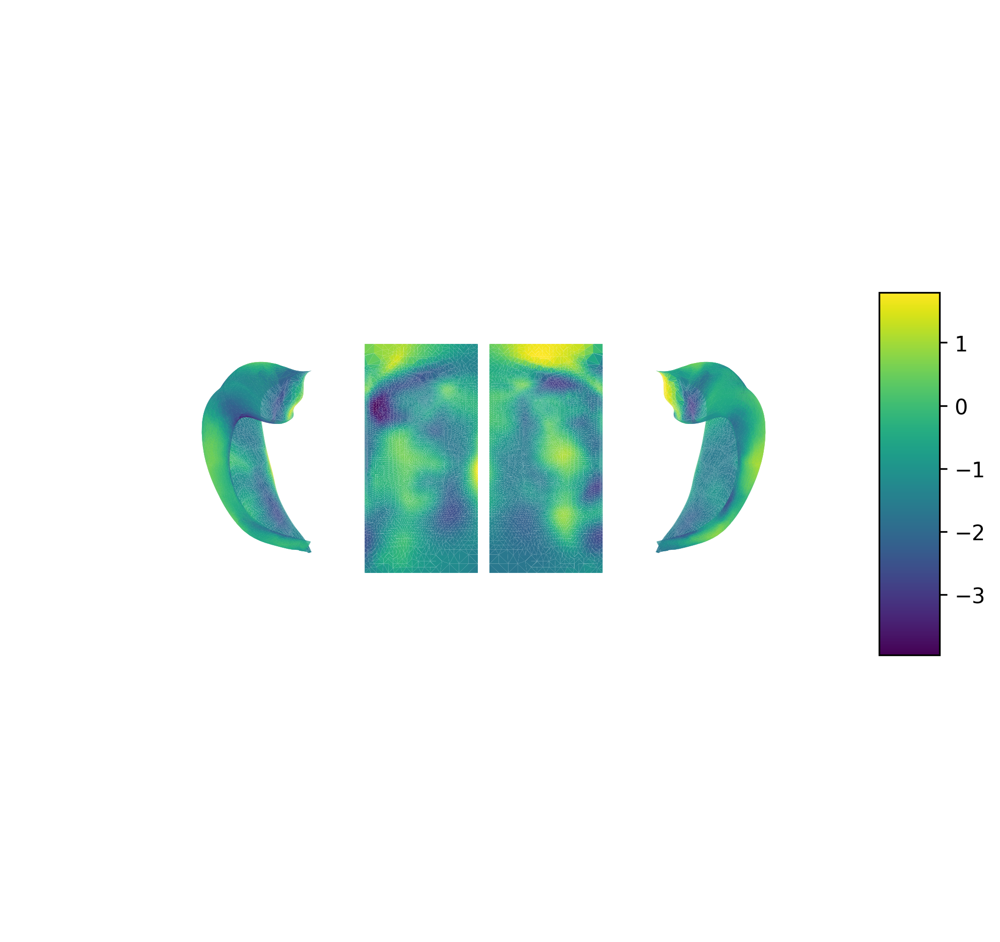

In [35]:
plot_surf(np.hstack([slm_groupL.t,slm_groupR.t]).T)

In [36]:
peak3_sigL = slm_groupL.P['pval']['P']<0.05
peak3_sigR = slm_groupR.P['pval']['P']<0.05
clus3_sigL = slm_groupL.P['pval']['C']<0.05
clus3_sigR = slm_groupR.P['pval']['C']<0.05

In [37]:
slm_groupL.P['peak'][1].head()

,t,clusid,vertid,P
0,3.958753,1,965,0.013330
1,3.741586,1,983,0.026685
2,3.575750,1,963,0.044153
3,3.386191,1,1212,0.076507
4,3.353754,1,950,0.083851


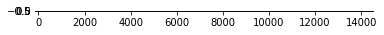

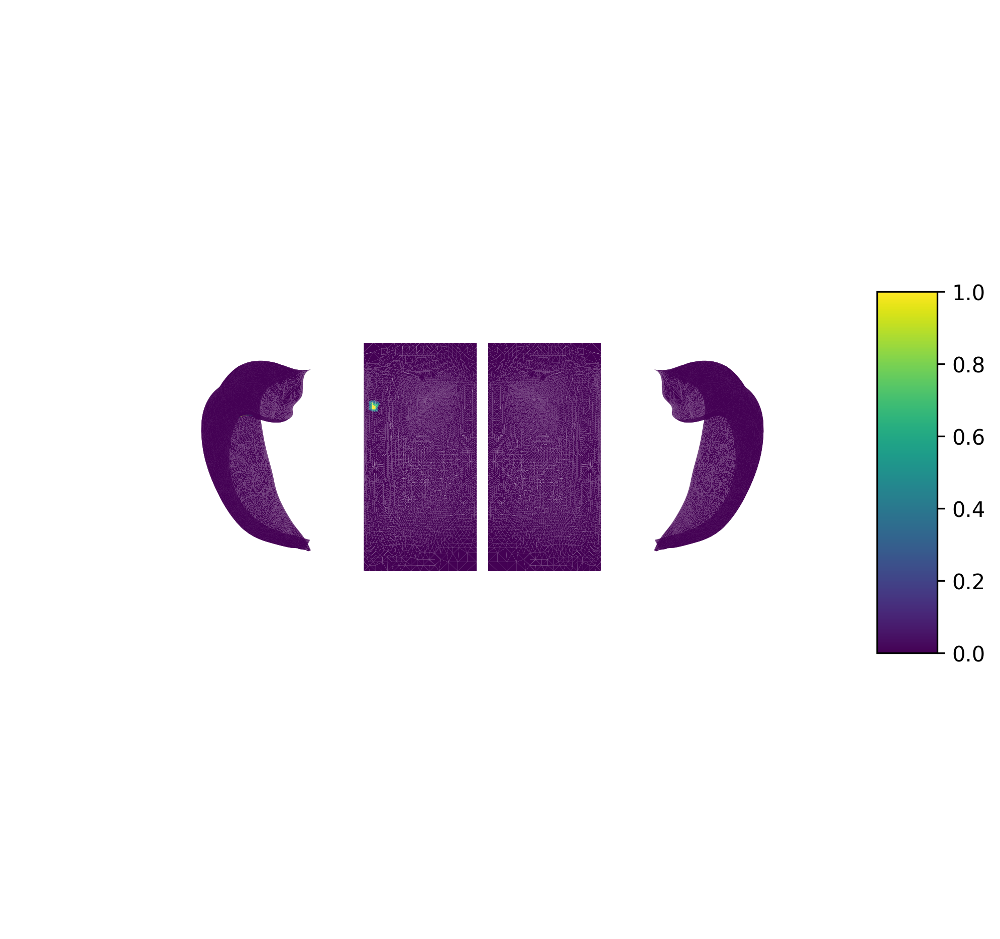

In [38]:
plot_surf(np.hstack([peak3_sigL,peak3_sigR]).T)

In [39]:
slm_groupL.P['clus'][1]

,clusid,nverts,resels,P
0,1,243.0,2.270787,0.001840
1,2,59.0,0.088548,0.427330
2,3,20.0,0.075760,0.439119


In [40]:
slm_groupR.P['clus'][1]

,clusid,nverts,resels,P
0,1,109.0,0.380424,0.223974
1,2,66.0,0.351700,0.240233
2,3,28.0,0.122486,0.408407


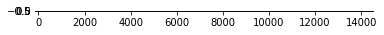

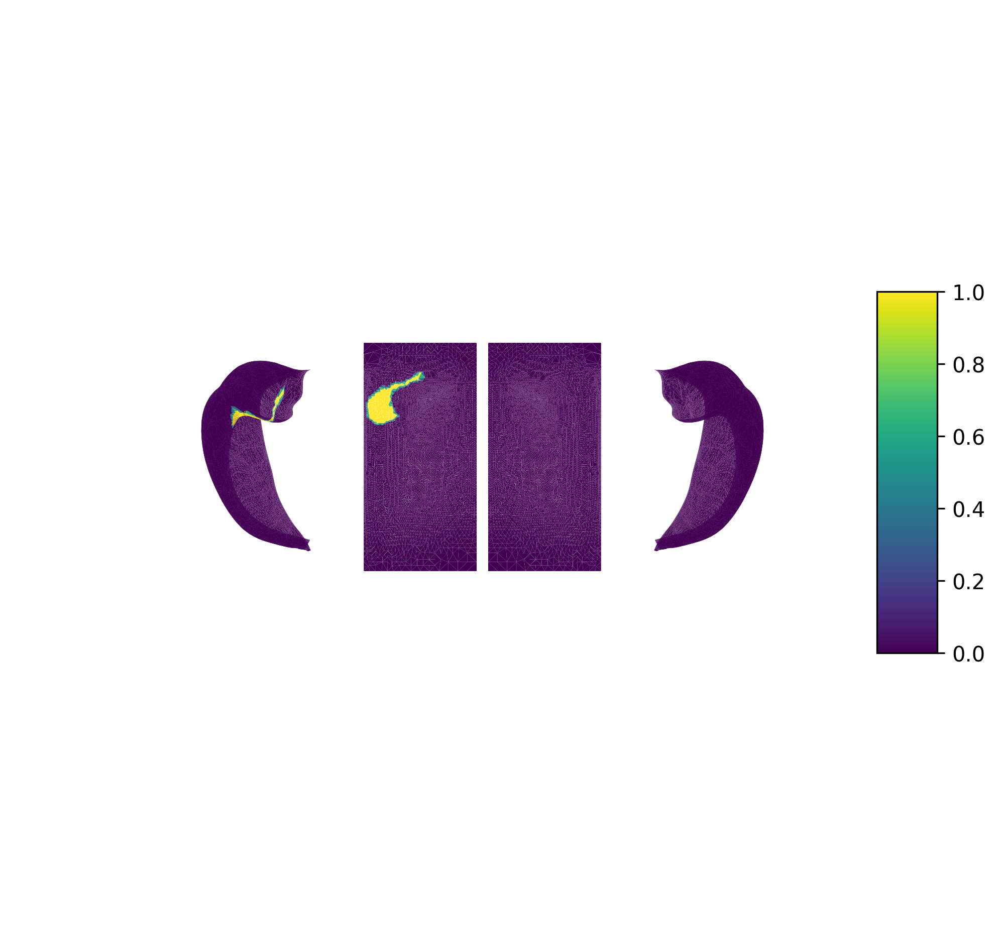

In [41]:
plot_surf(np.hstack([clus3_sigL,clus3_sigR]).T)

#### Model 5 (one-tail test)

So what if we hypothesize that hippocampal thickness either decreases with diabetes, then we can do a one way test. The main differences we've added are inverting the contrast and setting the `two_tail` argument to `False`

In [42]:
model_group = term_age + term_sex + term_age*term_sex + term_group

contrast_group = (df.group == 'dm').astype(int) - (df.group == 'controls').astype(int)

slm_group2L = SLM(
    model_group,
    -contrast_group,
    surf=surf,
    correction=["fdr", "rft"],
    cluster_threshold=0.01,
    two_tailed=False
)

slm_group2L.fit(thickL)

slm_group2R = SLM(
    model_group,
    -contrast_group,
    surf=surf,
    correction=["fdr", "rft"],
    cluster_threshold=0.01,
    two_tailed=False
)

slm_group2R.fit(thickR)

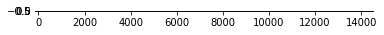

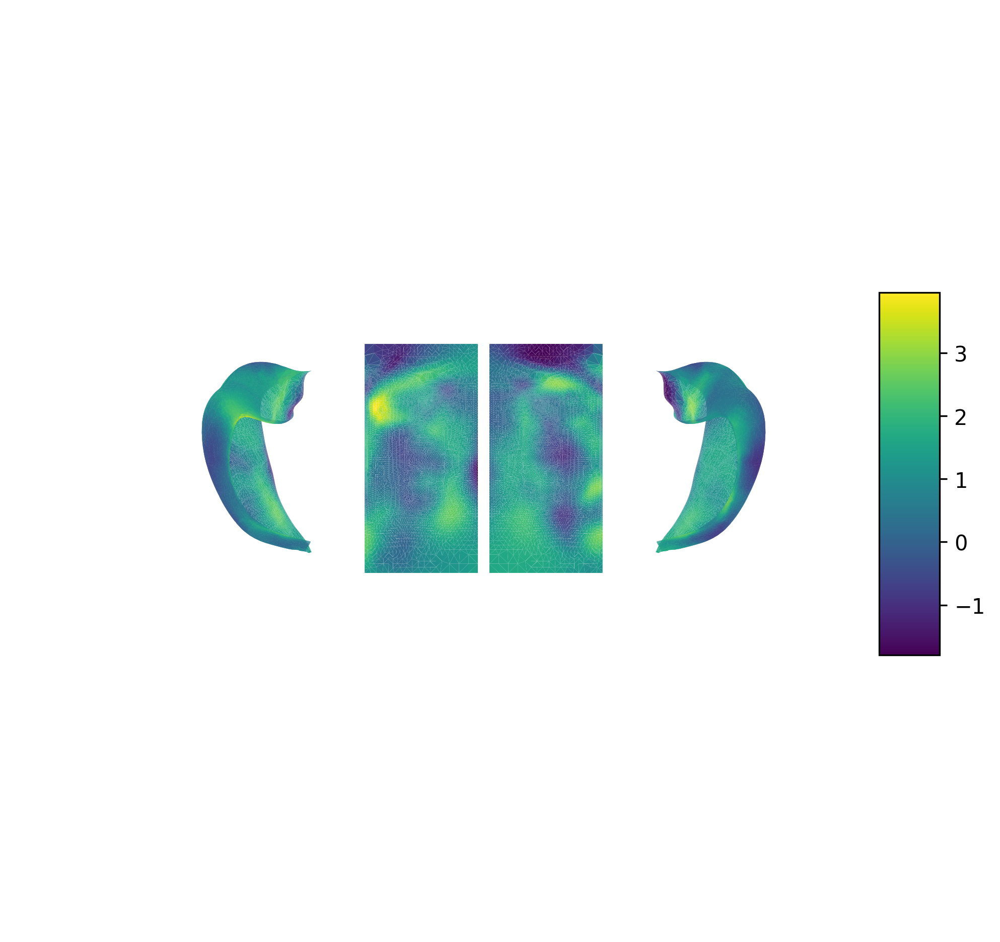

In [43]:
plot_surf(np.hstack([slm_group2L.t,slm_group2R.t]).T)

In [44]:
peak4_sigL = slm_group2L.P['pval']['P']<0.05
peak4_sigR = slm_group2R.P['pval']['P']<0.05
clus4_sigL = slm_group2L.P['pval']['C']<0.05
clus4_sigR = slm_group2R.P['pval']['C']<0.05

In [45]:
slm_groupL.P['peak'][1].head()

,t,clusid,vertid,P
0,3.958753,1,965,0.013330
1,3.741586,1,983,0.026685
2,3.575750,1,963,0.044153
3,3.386191,1,1212,0.076507
4,3.353754,1,950,0.083851


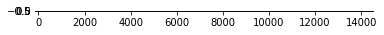

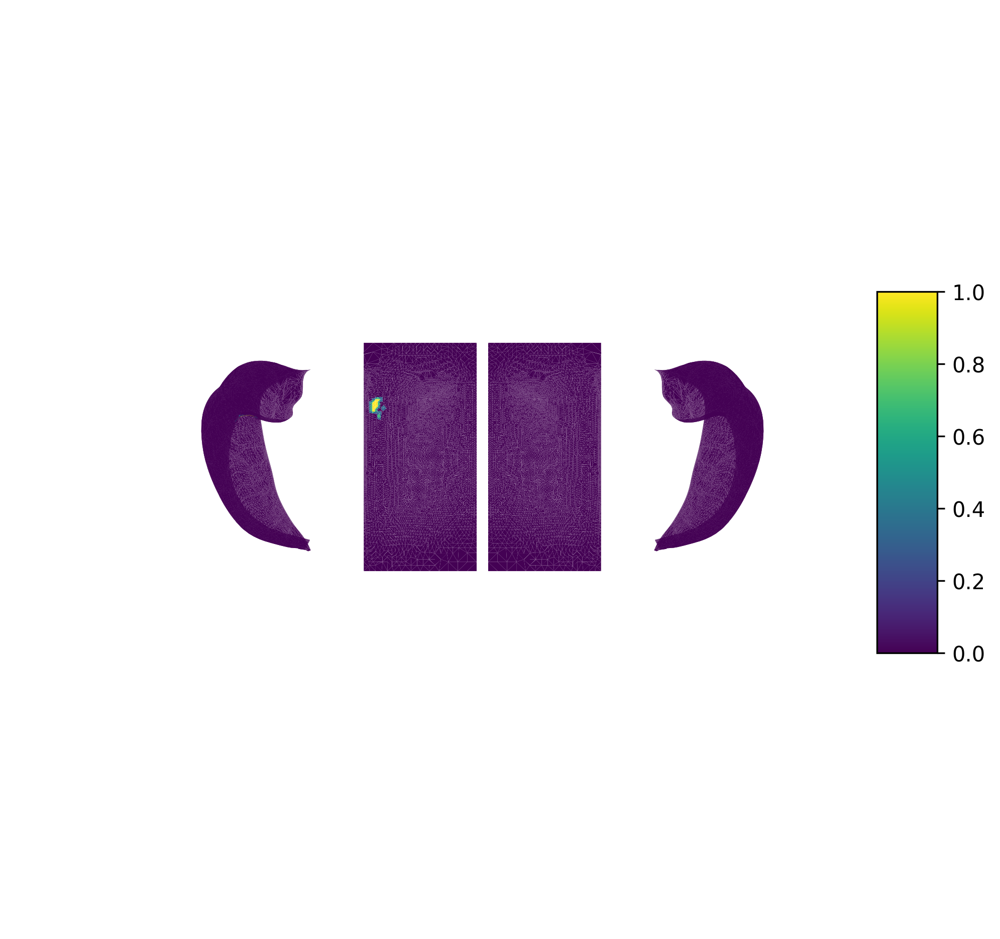

In [46]:
plot_surf(np.hstack([peak4_sigL,peak4_sigR]).T)

In [47]:
slm_groupL.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,243.0,2.270787,0.001840
1,2,59.0,0.088548,0.427330
2,3,20.0,0.075760,0.439119


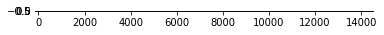

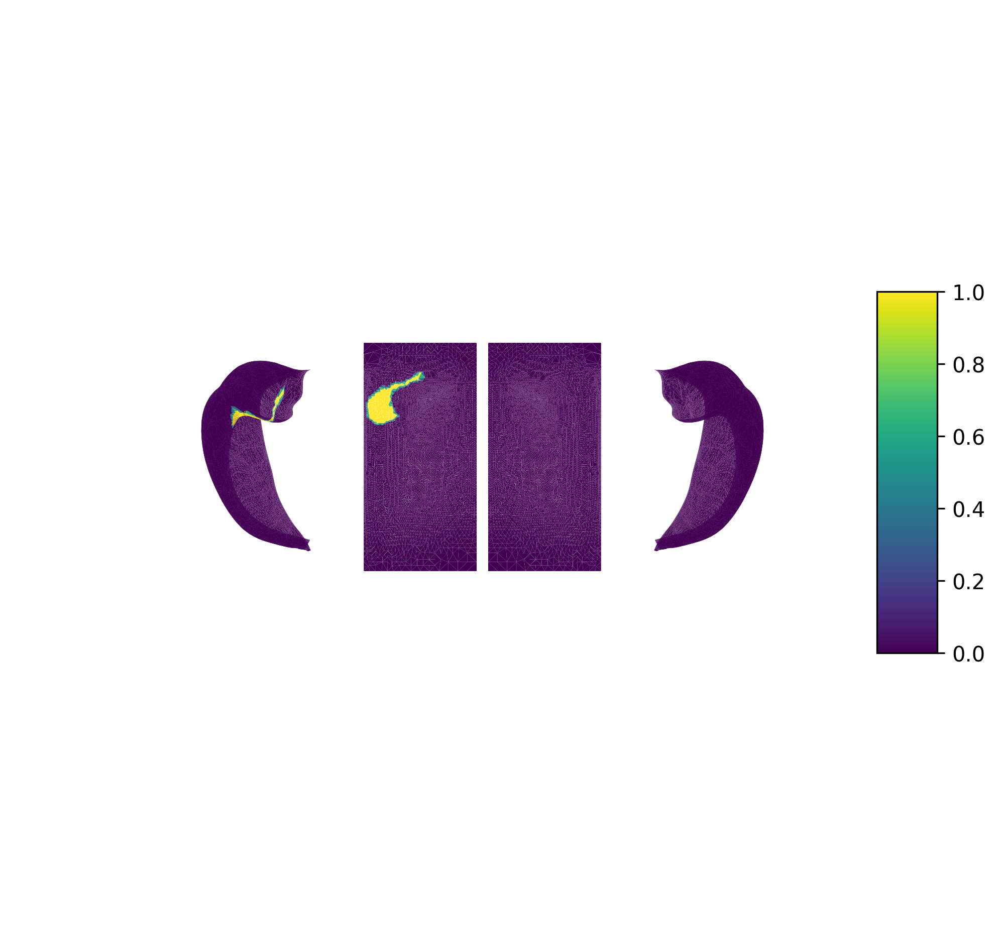

In [48]:
plot_surf(np.hstack([clus4_sigL,clus4_sigR]).T)